# CEA Simulations

In [ ]:
#Uncomment the line below to install pywavan (needed for the wavelet segment)
#!pip install git+https://github.com/jfrob27/pywavan.git

In [93]:
from pywavan import fbm2d, powspec, imsmooth, fan_trans, apodize, padding, gauss_beam, nb_scale, congrid
from turbustat.statistics import PDF
import aplpy
from astropy.io import fits
import itertools
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/Users/robitaij/anaconda2/envs/py38/lib/python3.8/site-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['cov']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [18]:
plt.rc('font', **{'family': 'serif', 'size': 32})
plt.rc('lines', linewidth = 2.5)
plt.rc('text', usetex=True)

## Delayed Gravity

In [19]:
#Read map
HDUdelay = fits.open('/Users/robitaij/postdoc/CEA_simu/rms3e3_delayed_grav/density_output_00094_z.fits')
imdelay = HDUdelay[0].data

### Rebin the map
The map is binned to reduce the amount of calculation. The binning will not affect the inertial range.

In [20]:
imbindelay = congrid(imdelay,np.array([1024,1024]))

INFO: Auto-setting vmin to  6.860e-01 [aplpy.core]
INFO: Auto-setting vmax to  2.188e+00 [aplpy.core]


INFO: Auto-setting vmin to  6.865e-01 [aplpy.core]
INFO: Auto-setting vmax to  2.139e+00 [aplpy.core]


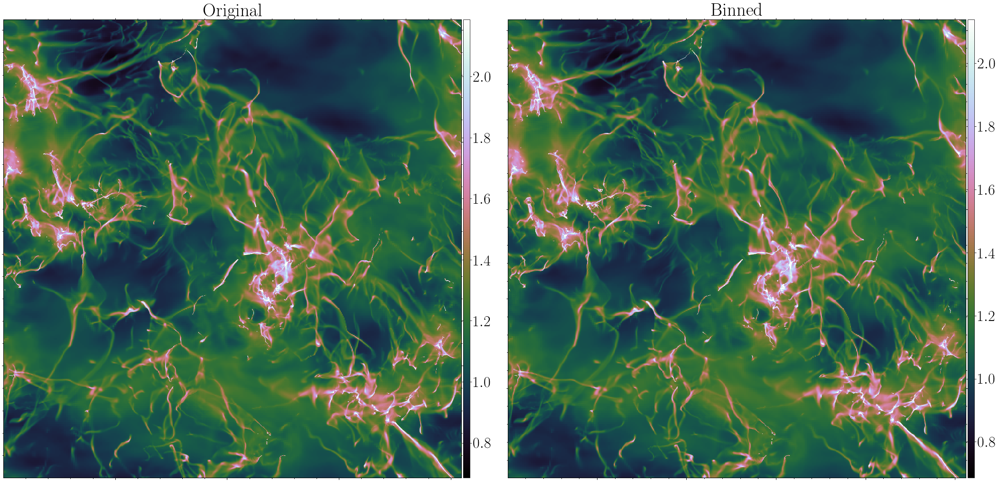

In [21]:
fig_all = plt.figure(1, figsize=(30,15))

fig = aplpy.FITSFigure(fits.PrimaryHDU(imdelay), figure=fig_all, subplot=(1, 2, 1))
fig.show_colorscale(cmap='cubehelix')
fig.add_colorbar()
fig.axis_labels.hide()
fig.tick_labels.hide()
fig.set_title('Original')

fig = aplpy.FITSFigure(fits.PrimaryHDU(imbindelay), figure=fig_all, subplot=(1, 2, 2))
fig.show_colorscale(cmap='cubehelix')
fig.add_colorbar()
fig.axis_labels.hide()
fig.tick_labels.hide()
fig.set_title('Binned')

plt.tight_layout()

## Fourier Power spectrum analysis

In [22]:
################
#Binned map
################
meanimbind = np.mean(imbindelay)
imzmbindelay = imbindelay - meanimbind

#Fourier power spectrum
tab_kbin_dl, spec_kbin_dl = powspec(imzmbindelay, reso=1)

################
#Original map
################
meanimdelay = np.mean(imdelay)
imzmdelay = imdelay - meanimdelay
del imdelay

#Fourier power spectrum
tab_k_dl, spec_k_dl = powspec(imzmdelay, reso=1)

Power law
-2.2116631862382543


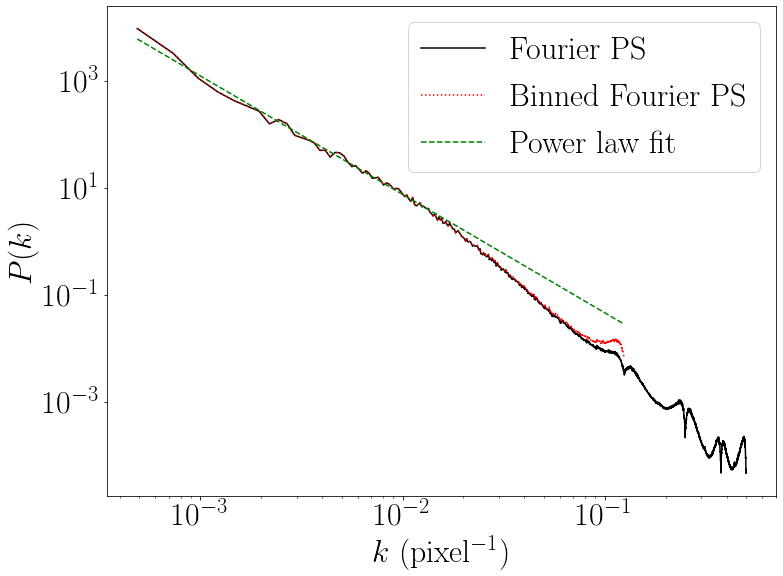

In [23]:
#Power law fit
limit_dl = np.where((tab_kbin_dl > tab_kbin_dl[0]) & (tab_kbin_dl < 0.05))
coef_dl,cov = np.polyfit(np.log(tab_kbin_dl[limit_dl]),np.log(spec_kbin_dl[limit_dl]),deg=1,cov=True)
yfit_dl = np.exp(coef_dl[1])*tab_kbin_dl**coef_dl[0]

print('Power law')
print(coef_dl[0])

plt.figure(figsize=(12,9))
plt.plot(tab_k_dl[1:], spec_k_dl[1:], color='black',label='Fourier PS', linewidth=1.5)
#Scales are divided by 4 because of the new pixel size & power multiplied by 4^2 because
#of the power normalisation by the number of pixels
plt.plot(tab_kbin_dl[1:]/4., spec_kbin_dl[1:]*4.**2.,':', color='red',label='Binned Fourier PS', linewidth=1.5)
plt.plot(tab_kbin_dl[1:]/4., yfit_dl[1:]*4.**2.,'--', color='green',label='Power law fit', linewidth=1.5)
plt.plot()
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r"$k$ (pixel$^{-1}$)")
plt.ylabel(r"$P(k)$")
plt.legend()

The binned map has the same inertial range than the original map. First part of the spectrum can be fitted by a single power law of $-2.2$.

The Fourier power spectrum is not sensitive to non-Gaussianities as expected in a simulation with self-gravity. Wavelet analysis allows us to locate the non-Gaussianities as a function of scales and to calculate a non biaised power spectrum for the Gaussian part of the signal.

Text(0.5, 1.0, 'PDF')

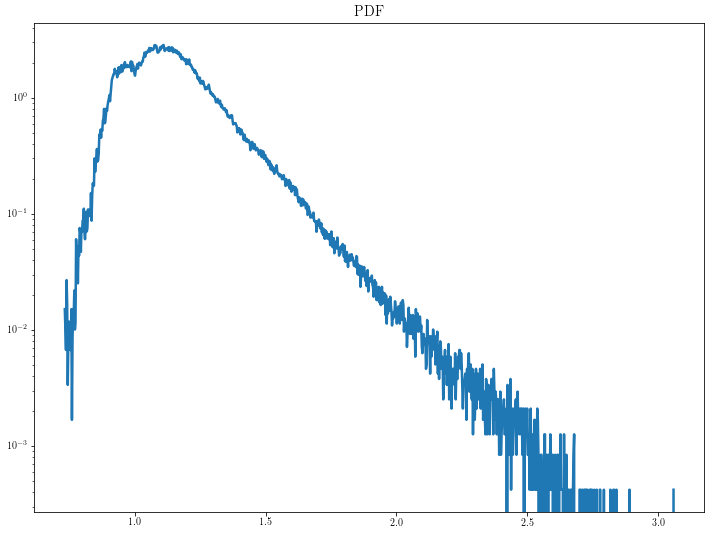

In [107]:
pdf_dl = PDF(imbindelay, bins=None)  
pdf_dl.run(verbose=False, do_fit=False)

figure(figsize=(12,9))
pdfbinsdl = pdf_dl.bins
pdfdl = pdf_dl.pdf
plot(pdfbinsdl, pdfdl)
yscale('log')
title('PDF',fontsize='x-large')

## Wavelet transform and segmentation
*fan_trans* is the main function used for the Multi-scale non-Gaussian Segmentation (MnGSeg) procedure. The **pywavan** package can be installed using the following command:

`pip install git+https://github.com/jfrob27/pywavan.git`

*fan_trans* decompose the map in a set of quasi-orthogonal complex Morlet wavelets as a function of scales and orientations of spatial fluctuations. For a **q** parameter different of zero, *fan_trans* will segment the wavelet coefficients as a function of scales and orientations in order to separate the non-Gaussianities. The parameter **q** is related to the threshold, which is optimised for every directions and scales when **qdyn** is set to **True**.

The command `fan_trans?` will give you the manual for the function. For this analysis, we will use outputs **wav_k** and **S1a**, which are respectively the vector of scales and averaged wavelet power spectra. **wt** are the complex wavelet coeffcients. We will them to reconstruct the Gaussian (fractal) plus coherent (non-Gaussian) parts of the map. 

In [7]:
#Set a list of q
q=[]
q=[2.9]*nb_scale(imzmbindelay.shape)

#Wavelet power spectrum
wt_dl, S11a_dl, wav_k_dl, S1a_dl, q_dl = fan_trans(imzmbin, reso=1, q=q, qdyn=True, skewl=0.4)

100%|██████████| 24/24 [24:29<00:00, 61.25s/it] 


In [8]:
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_wav_k.npy',wav_k_dl)
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_S1a.npy',S1a_dl)
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_wt.npy',wt_dl)
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_S11a.npy',S11a_dl)
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_q.npy',q_dl)

In [24]:
wav_k_dl = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_wav_k.npy')
S1a_dl = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_S1a.npy')
wt_dl = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_wt.npy')
S11a_dl = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_S11a.npy')
q_dl = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_094_z_q.npy')

INFO: Auto-setting vmin to  7.898e-01 [aplpy.core]
INFO: Auto-setting vmax to  1.641e+00 [aplpy.core]


INFO: Auto-setting vmin to  8.526e-01 [aplpy.core]
INFO: Auto-setting vmax to  1.865e+00 [aplpy.core]


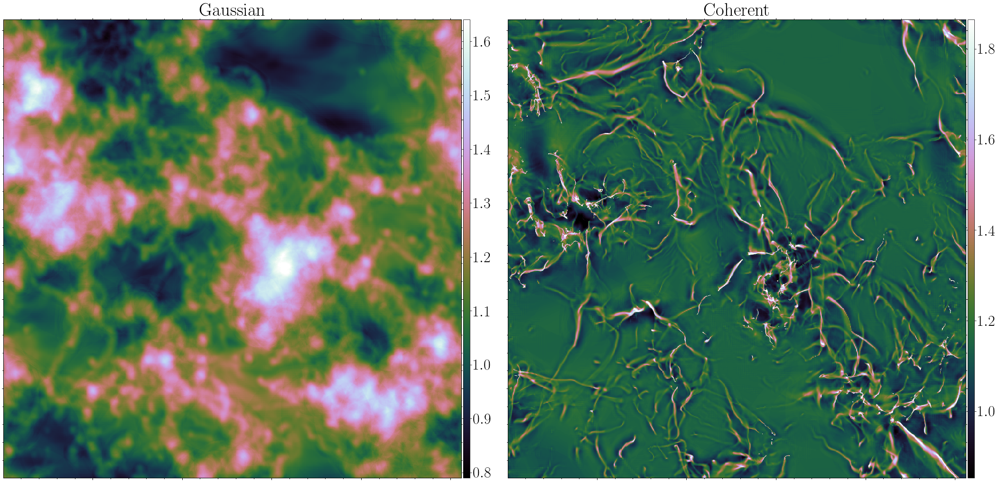

In [25]:
M = nb_scale(imzmbindelay.shape)

#Map reconstruction of the Gaussian (fractal) and coherent (non-Gaussian) part
coherent_dl = np.sum(wt_dl[M:2*M,:,:],axis=0).real + meanimbind
Gaussian_dl = np.sum(wt_dl[2*M:3*M,:,:],axis=0).real + meanimbind

fig_all = plt.figure(1, figsize=(30,15))

fig = aplpy.FITSFigure(fits.PrimaryHDU(Gaussian_dl), figure=fig_all, subplot=(1, 2, 1))
fig.show_colorscale(cmap='cubehelix')
fig.add_colorbar()
fig.axis_labels.hide()
fig.tick_labels.hide()
fig.set_title('Gaussian')

fig = aplpy.FITSFigure(fits.PrimaryHDU(coherent_dl), figure=fig_all, subplot=(1, 2, 2))
fig.show_colorscale(cmap='cubehelix')
fig.add_colorbar()
fig.axis_labels.hide()
fig.tick_labels.hide()
fig.set_title('Coherent')

plt.tight_layout()

In [26]:
#Bin Normalisation
tab_kbin_dlc, wav_k_dlc = tab_kbin_dl/4., wav_k_dl/4.
spec_kbin_dlc, S1a_dlc = spec_kbin_dl*4.**2., S1a_dl*4.**2.

### Wavelet power spectra

The wavelet transforms are designed to reproduce the Fourier power spectrum when the coefficeints are averaged:

$$P^W(l,\vec{x})=\frac{\delta \theta}{N_{\theta}} \sum_{j=0}^{N_{\theta}-1}  |\tilde{f}(l,\vec{x},\theta_j)|^2$$

$$P^W(l)=\frac{1}{N_{\vec{x}}} \sum_{\vec{x}} P^W(l,\vec{x})$$

where $\tilde{f}(l,\vec{x},\theta)$ are the Morlet wavelet coefficients for map $f(\vec{x})$ and $N_{\theta}=\Delta \theta/\delta \theta$ is the number of directions $\theta$ needed to sample the Fourier space over the range $\Delta \theta$ ([Robitaille et al. 2019](https://ui.adsabs.harvard.edu/abs/2019arXiv190511492R/abstract)).

The Fourier power spectrum is not sensitive to non-Gaussianities. However, the wavelet segmentation allows us to calculate their enegy distribution through the wavelet power spectrum of non-Gaussian coefficients only (**Coherent PS**). In the litterature and according to the fractal formalism ([Frisch 1995](http://adsabs.harvard.edu/abs/1995turb.book.....F)), the Gaussian field, which respect a power law scaling, is mono-fractal by nature, and thus fully described by its single power law. The non-Gaussian part has multi-fractal properties ([Robitaille et al. 2020](https://arxiv.org/abs/2007.08206)) and, consequently, cannot be fully described by its power spectrum. Nevertheless, the coherent power spectrum can give us an estimation of the non-Gaussian energy distribution as a function of scales.

Gaussian Power law
-2.7893371004962275 

Coherent Power law
-0.04548102417163593
-1.4201716213586373
-3.0469671945537598


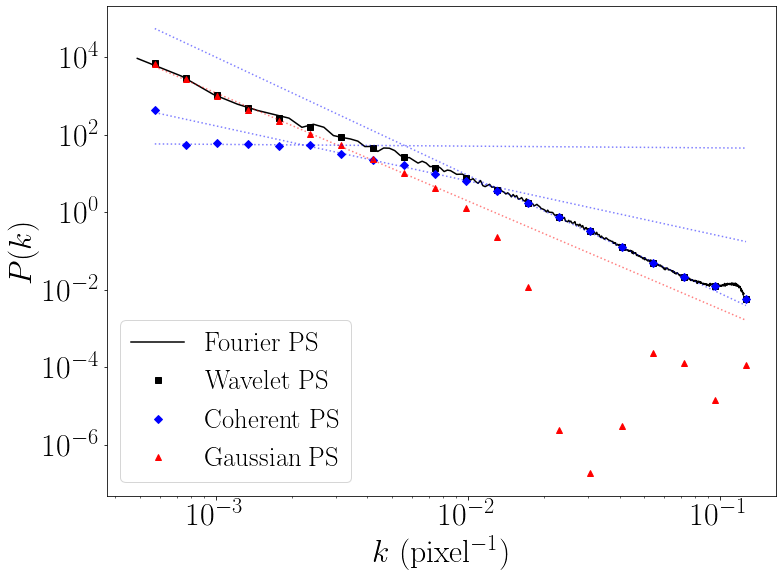

In [41]:
# Gaussian Power law fit
coefw_dl,cov = np.polyfit(np.log(wav_k_dlc[3:12]),np.log(S1a_dlc[2,3:12]),deg=1,cov=True)
yfitw_dl = np.exp(coefw_dl[1])*wav_k_dlc**coefw_dl[0]

print('Gaussian Power law')
print(coefw_dl[0],'\n')

# Coherent Power law fit 1/3
coefcw_dl,cov = np.polyfit(np.log(wav_k_dlc[4:9]),np.log(S1a_dlc[1,4:9]),deg=1,cov=True)
yfitcw_dl = np.exp(coefcw_dl[1])*wav_k_dlc**coefcw_dl[0]

print('Coherent Power law')
print(coefcw_dl[0])

# Coherent Power law fit 2/3
coefcw_dl2,cov = np.polyfit(np.log(wav_k_dlc[9:14]),np.log(S1a_dlc[1,9:14]),deg=1,cov=True)
yfitcw_dl2 = np.exp(coefcw_dl2[1])*wav_k_dlc**coefcw_dl2[0]

print(coefcw_dl2[0])

# Coherent Power law fit 3/3
coefcw_dl3,cov = np.polyfit(np.log(wav_k_dlc[14:21]),np.log(S1a_dlc[1,14:21]),deg=1,cov=True)
yfitcw_dl3 = np.exp(coefcw_dl3[1])*wav_k_dlc**coefcw_dl3[0]

print(coefcw_dl3[0])

plt.figure(figsize=(12,9))
plt.plot(tab_kbin_dlc[1:], spec_kbin_dlc[1:], color='black',label='Fourier PS', linewidth=1.5)
plt.plot(wav_k_dlc[3:-1], S1a_dlc[0,3:-1],'s',color='black', label='Wavelet PS')
plt.plot(wav_k_dlc[3:-1], S1a_dlc[1,3:-1],'D',color='blue', label='Coherent PS')
plt.plot(wav_k_dlc[3:-1], S1a_dlc[2,3:-1],'^',color='red', label='Gaussian PS')
#plt.plot(tab_kbin_dl/4., yfit_dl*4.**2.,':', color='black',label='Fits', linewidth=1.5, alpha=0.5)
plt.plot(wav_k_dlc[3:-1], yfitw_dl[3:-1],':', color='red', linewidth=1.5, alpha=0.5)
plt.plot(wav_k_dlc[3:-1], yfitcw_dl[3:-1],':', color='blue', linewidth=1.5, alpha=0.5)
plt.plot(wav_k_dlc[3:-1], yfitcw_dl2[3:-1],':', color='blue', linewidth=1.5, alpha=0.5)
plt.plot(wav_k_dlc[3:-1], yfitcw_dl3[3:-1],':', color='blue', linewidth=1.5, alpha=0.5)
plt.plot()
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r"$k$ (pixel$^{-1}$)")
plt.ylabel(r"$P(k)$")
plt.legend(fontsize="small")

As suggested above, the drop of power at $k\sim 10^{-2}$ is most probably due to the lack of resolution for diffuse gas (Gaussian fluctuations) at small scales. Before the drop, the Gaussian part of the field respect a power law of $-2.8$. As perform below, this power law can be used to generate a fractional Brownien motion (fBm) map with similar statistical properties.

It is interesting to note that non-Gaussianities (coherent part) has a flat power spectrum at large scales. We will compare this characteristic with self-gravity is turned on from the beginning.

## Self-gravity is turned on from the beginning

In [28]:
#Read map
HDU = fits.open('/Users/robitaij/postdoc/CEA_simu/density_output_00048_z.fits')
im = HDU[0].data

Rebin the map

In [29]:
imbin = congrid(im,np.array([1024,1024]))

INFO: Auto-setting vmin to  5.339e-01 [aplpy.core]
INFO: Auto-setting vmax to  2.399e+00 [aplpy.core]


INFO: Auto-setting vmin to  5.254e-01 [aplpy.core]
INFO: Auto-setting vmax to  2.438e+00 [aplpy.core]


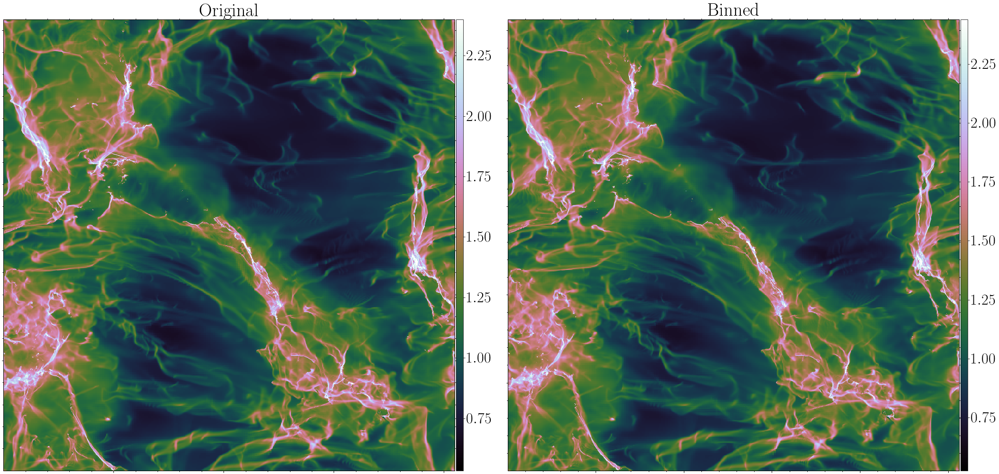

In [30]:
fig_all = plt.figure(1, figsize=(30,15))

fig = aplpy.FITSFigure(fits.PrimaryHDU(im), figure=fig_all, subplot=(1, 2, 1))
fig.show_colorscale(cmap='cubehelix')
fig.add_colorbar()
fig.axis_labels.hide()
fig.tick_labels.hide()
fig.set_title('Original')

fig = aplpy.FITSFigure(fits.PrimaryHDU(imbin), figure=fig_all, subplot=(1, 2, 2))
fig.show_colorscale(cmap='cubehelix')
fig.add_colorbar()
fig.axis_labels.hide()
fig.tick_labels.hide()
fig.set_title('Binned')

plt.tight_layout()

In [31]:
################
#Binned map
################
meanimbin = np.mean(imbin)
imzmbin = imbin - np.mean(imbin)

#Fourier power spectrum
tab_kbin, spec_kbin = powspec(imzmbin, reso=1)

################
#Original map
################
meanim = np.mean(im)
imzm = im - np.mean(im)
del im

#Fourier power spectrum
tab_k, spec_k = powspec(imzm, reso=1)

Power law
-2.396628636452464


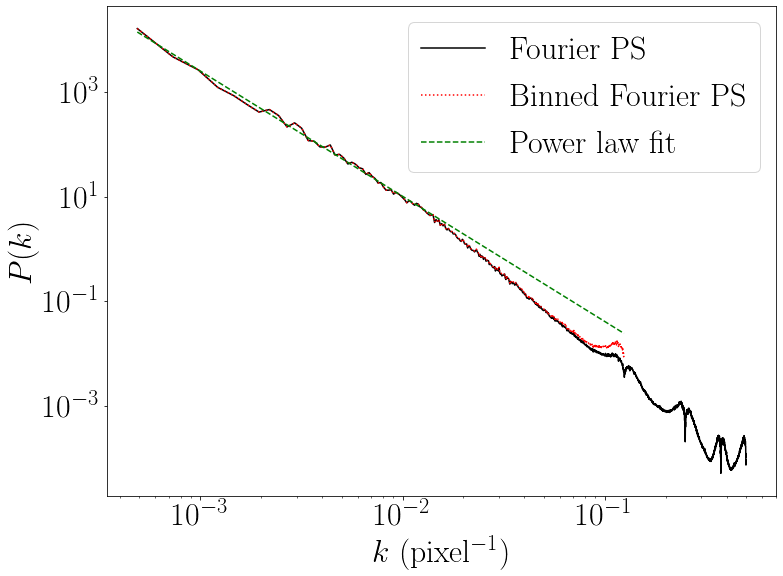

In [32]:
#Power law fit
limit = np.where((tab_kbin > tab_kbin[0]) & (tab_kbin < 0.05))
coef,cov = np.polyfit(np.log(tab_kbin[limit]),np.log(spec_kbin[limit]),deg=1,cov=True)
yfit = np.exp(coef[1])*tab_kbin**coef[0]

print('Power law')
print(coef[0])

plt.figure(figsize=(12,9))
plt.plot(tab_k[1:], spec_k[1:], color='black',label='Fourier PS', linewidth=1.5)
#Scales are divided by 4 because of the new pixel size & power multiplied by 4^2 because
#of the power normalisation by the number of pixels
plt.plot(tab_kbin[1:]/4., spec_kbin[1:]*4.**2.,':', color='red',label='Binned Fourier PS', linewidth=1.5)
plt.plot(tab_kbin[1:]/4., yfit[1:]*4.**2.,'--', color='green',label='Power law fit', linewidth=1.5)
plt.plot()
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r"$k$ (pixel$^{-1}$)")
plt.ylabel(r"$P(k)$")
plt.legend()

Similar power spectrum with a steeper power law, which could reveal a greater amount of structures at large scales.

Text(0.5, 1.0, 'PDF')

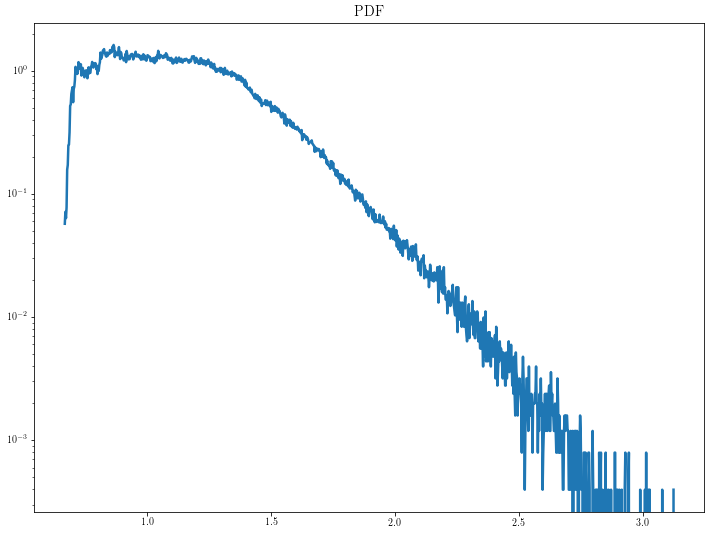

In [109]:
pdf = PDF(imbin, bins=None)  
pdf.run(verbose=False, do_fit=False)

figure(figsize=(12,9))
pdfbins = pdf.bins
pdf = pdf.pdf
plot(pdfbins, pdf)
yscale('log')
title('PDF',fontsize='x-large')

In [68]:
#Set a list of q
q=[]
q=[2.9]*nb_scale(imzmbin)

#Wavelet power spectrum
wt, S11a, wav_k, S1a, q = fan_trans(imzmbin, reso=1, q=q, qdyn=True, skewl=0.4)

100%|██████████| 24/24 [24:10<00:00, 60.44s/it] 


In [69]:
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_wav_k.npy',wav_k)
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_S1a.npy',S1a)
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_wt.npy',wt)
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_S11a.npy',S11a)
np.save('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_q.npy',q)

In [33]:
wav_k = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_wav_k.npy')
S1a = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_S1a.npy')
wt = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_wt.npy')
S11a = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_S11a.npy')
q = np.load('/Users/robitaij/postdoc/CEA_simu/analysis/simu_048_z_q.npy')

INFO: Auto-setting vmin to  6.110e-01 [aplpy.core]
INFO: Auto-setting vmax to  1.781e+00 [aplpy.core]


INFO: Auto-setting vmin to  7.250e-01 [aplpy.core]
INFO: Auto-setting vmax to  2.086e+00 [aplpy.core]


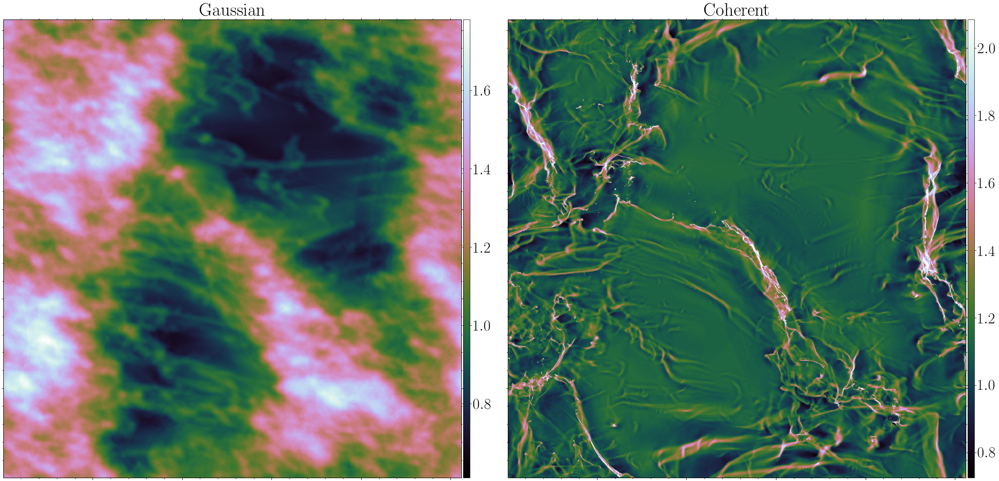

In [34]:
M = nb_scale(imbin.shape)

coherent = np.sum(wt[M:2*M,:,:],axis=0).real + meanimbin
Gaussian = np.sum(wt[2*M:3*M,:,:],axis=0).real + meanimbin

fig_all = plt.figure(1, figsize=(30,15))

fig = aplpy.FITSFigure(fits.PrimaryHDU(Gaussian), figure=fig_all, subplot=(1, 2, 1))
fig.show_colorscale(cmap='cubehelix')
fig.add_colorbar()
fig.axis_labels.hide()
fig.tick_labels.hide()
fig.set_title('Gaussian')

fig = aplpy.FITSFigure(fits.PrimaryHDU(coherent), figure=fig_all, subplot=(1, 2, 2))
fig.show_colorscale(cmap='cubehelix')
fig.add_colorbar()
fig.axis_labels.hide()
fig.tick_labels.hide()
fig.set_title('Coherent')

plt.tight_layout()

In [35]:
#Bin Normalisation
tab_kbinc, wav_kc = tab_kbin/4., wav_k/4.
spec_kbinc, S1ac = spec_kbin*4.**2., S1a*4.**2.

Gaussian Power law
-2.985665036914564 

Coherent Power law
-1.2616612382985566 
 -2.280018101854656 
 -3.142981624354026


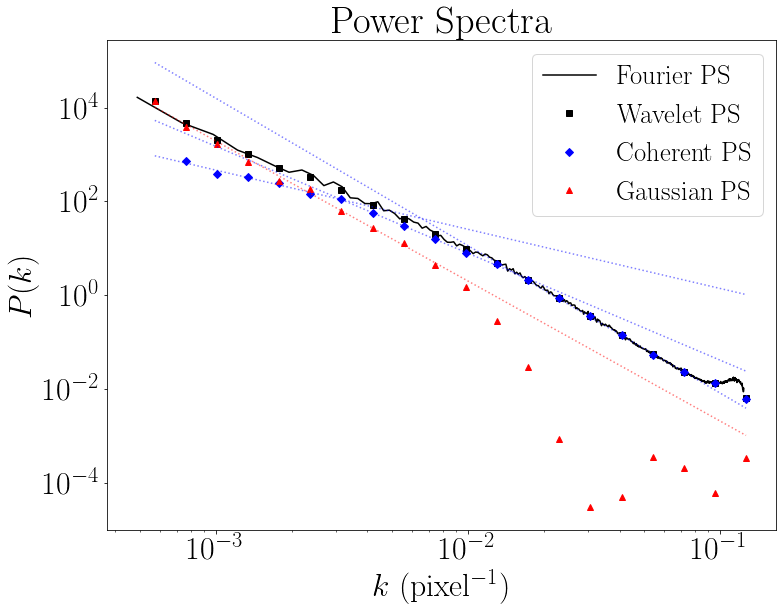

In [39]:
# Gaussian Power law fit
coefw,cov = np.polyfit(np.log(wav_kc[3:12]),np.log(S1ac[2,3:12]),deg=1,cov=True)
yfitw = np.exp(coefw[1])*wav_kc**coefw[0]

print('Gaussian Power law')
print(coefw[0],'\n')

# Coherent Power law fit 1/3
coefcw,cov = np.polyfit(np.log(wav_kc[4:10]),np.log(S1ac[1,4:10]),deg=1,cov=True)
yfitcw = np.exp(coefcw[1])*wav_kc**coefcw[0]

# Coherent Power law fit 2/3
coefcw2,cov = np.polyfit(np.log(wav_kc[10:14]),np.log(S1ac[1,10:14]),deg=1,cov=True)
yfitcw2 = np.exp(coefcw2[1])*wav_kc**coefcw2[0]

# Coherent Power law fit 3/3
coefcw3,cov = np.polyfit(np.log(wav_kc[14:21]),np.log(S1ac[1,14:21]),deg=1,cov=True)
yfitcw3 = np.exp(coefcw3[1])*wav_kc**coefcw3[0]

print('Coherent Power law')
print(coefcw[0],'\n',coefcw2[0],'\n',coefcw3[0])

plt.figure(figsize=(12,9))
plt.plot(tab_kbinc[1:], spec_kbinc[1:], color='black',label='Fourier PS', linewidth=1.5)
plt.plot(wav_kc[3:-1], S1ac[0,3:-1],'s',color='black', label='Wavelet PS')
plt.plot(wav_kc[3:-1], S1ac[1,3:-1],'D',color='blue', label='Coherent PS')
plt.plot(wav_kc[3:-1], S1ac[2,3:-1],'^',color='red', label='Gaussian PS')
#plt.plot(tab_kbin/4., yfit*4.**2.,':', color='black',label='Fits', linewidth=1.5, alpha=0.5)
plt.plot(wav_kc[3:-1], yfitw[3:-1],':', color='red', linewidth=1.5, alpha=0.5)
plt.plot(wav_kc[3:-1], yfitcw[3:-1],':', color='blue', linewidth=1.5, alpha=0.5)
plt.plot(wav_kc[3:-1], yfitcw2[3:-1],':', color='blue', linewidth=1.5, alpha=0.5)
plt.plot(wav_kc[3:-1], yfitcw3[3:-1],':', color='blue', linewidth=1.5, alpha=0.5)
plt.plot()
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r"$k$ (pixel$^{-1}$)")
plt.ylabel(r"$P(k)$")
plt.title("Power Spectra")
plt.legend(fontsize='small')

## Analysis...

| PS | Delayed Gravity | Not Delayed | 
| :- | -: | -: |
| Fourier | $-2.21$ | $-2.40$ |
| Gaussian | $-2.78$ | $-2.99$ |
| Coherent 1 | $-0.04$ | $-1.26$ |
| Coherent 2 | $-1.42$ | $-2.28$ |
| Coherent 3 | $-3.05$ | $-3.14$ |
Power laws of both simulations

The discrimination of both simulations according only to their Fourier power spectra is rather difficult. On the other hand, we see that the introduction of self-gravity seems to affect significantly the non-Gaussianities power laws. In both cases three power laws can be fitted and the steeper slopes are associated to the simulation where self-gravity is turn on from the beginning. These results seems to reflect the fact that self-gravity will produce more and more dense structures over time.

The power laws associated with the Gaussian part dominates at large scales and do not change significantly between the two simulations.

# Statistical model
### fractional Brownien motion (fBm) map

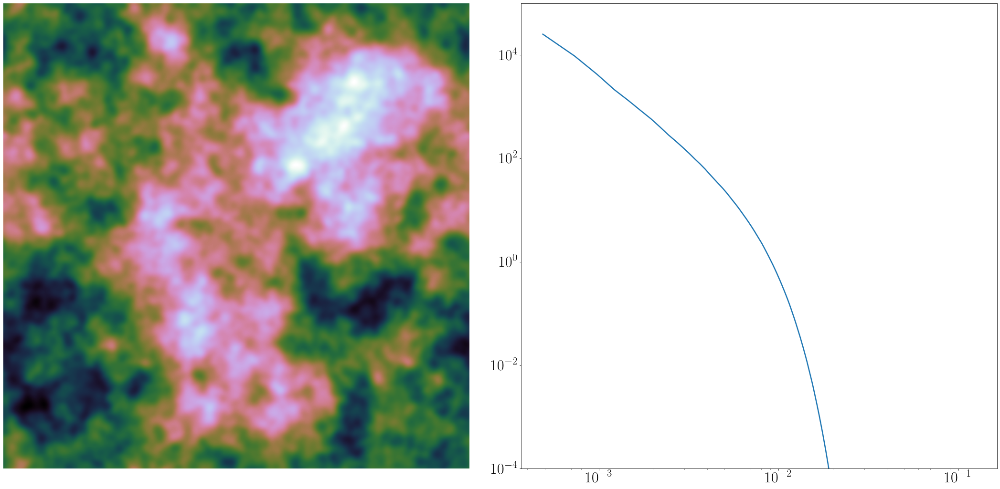

In [81]:
gamma1 = -2.99
fbm = fbm2d(-2.8,1024,1024)
fbm = fbm * np.std(Gaussian) + meanimbin

smooth_fbm = imsmooth(fbm, 15)

tab_kfbm, spec_kfbm = powspec(smooth_fbm)

figure(figsize=(30,15))

subplot(1,2,1)
imshow(smooth_fbm,cmap='cubehelix')
plt.axis('off')

subplot(1,2,2)
plot(tab_kfbm[1:]/4., spec_kfbm[1:]*4.**2.)
xscale('log')
yscale('log')
ylim([1e-4, 1e5])

plt.tight_layout()

### Multiplicative cascade multifractal model

The multiplicative cascade model is based on the multiplication on individual scales at differetn orientations. This particular model model produces highly contrasted structures with multifracatal properties, which are hidden by the single power law of their Fourier power spectrum ([Robitaille et al. 2020](https://arxiv.org/abs/2007.08206)). This model also account for the lognormal distribution of multiplicative processes measured in the interstallar medium.

Here, the multifractal part will be modelled by only one power law, which fails to reproduce the multiple power laws (created by the adaptative mesh?) seen in simulations.

In [88]:
gamma2 = -2.28
pcross = 10

print('fBm angular wavelet transforms')
wtfbm, S11afbm, wav_kfbm, S1afbm, qfbm = fan_trans(fbm, reso=1, q=0, qdyn=False, angular=True)
A = np.polyfit(np.log(wav_kfbm[3:-1]), np.log(S1afbm[3:-1]),deg=1)
BB = np.exp(A[1])

#Create multifractal filaments
multi=np.zeros((1024,1024))
cohe=np.zeros((1024,1024))

#Set of directions
dirset = []

for j in range(6):
    multi=np.ones((1024,1024))   
    for i in range(np.size(wav_kfbm)):
        aa=np.real(wtfbm[i,j,:,:])
        bb=np.exp(aa/np.std(aa)*0.2)
        multi *= bb 
    cohe+=multi

print('Filaments wavelet transforms')
wtfb1, S11a1, wav_k, S1afb1, q = fan_trans(cohe, reso=1, q=0, qdyn=True, skewl=0.4)

#Change its power-law
scross = wav_kfbm[pcross]

DD = BB * scross**(gamma1 - gamma2)
Nwt = np.zeros_like(wtfb1)
for i in range(wav_k.size):
    Nwt[i,:,:] = (wtfb1[i,:,:]/np.sqrt(S1afb1[i]))*np.sqrt(DD*wav_k[i]**gamma2)
mfrac = np.sum(Nwt,axis=0).real

  0%|          | 0/24 [00:00<?, ?it/s]

fBm angular wavelet transforms


  0%|          | 0/24 [00:00<?, ?it/s]

Filaments wavelet transforms


100%|██████████| 24/24 [00:23<00:00,  1.00it/s]


INFO: Auto-setting vmin to  5.002e-01 [aplpy.core]
INFO: Auto-setting vmax to  4.136e+00 [aplpy.core]


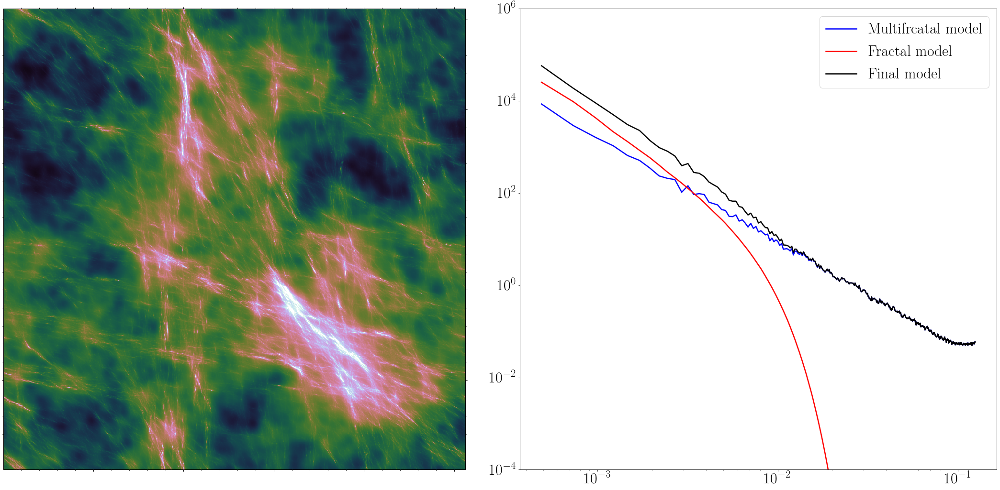

In [90]:
tab_kmfrac, spec_kmfrac = powspec(mfrac)
tab_ksum, spec_ksum = powspec(mfrac+smooth_fbm)

fig_all = figure(1,figsize=(30,15))

fig = aplpy.FITSFigure(fits.PrimaryHDU(mfrac+smooth_fbm), figure=fig_all, subplot=(1, 2, 1))
fig.show_colorscale(cmap='cubehelix')
fig.axis_labels.hide()
fig.tick_labels.hide()

subplot(1,2,2)
plot(tab_kmfrac[1:]/4., spec_kmfrac[1:]*4.**2.,color='blue',label='Multifrcatal model')
plot(tab_kfbm[1:]/4., spec_kfbm[1:]*4.**2.,color='red',label='Fractal model')
plot(tab_ksum[1:]/4., spec_ksum[1:]*4.**2.,color='black',label='Final model')
xscale('log')
yscale('log')
ylim([1e-4, 1e6])
legend(fontsize='medium')

plt.tight_layout()

Text(0.5, 1.0, 'PDF')

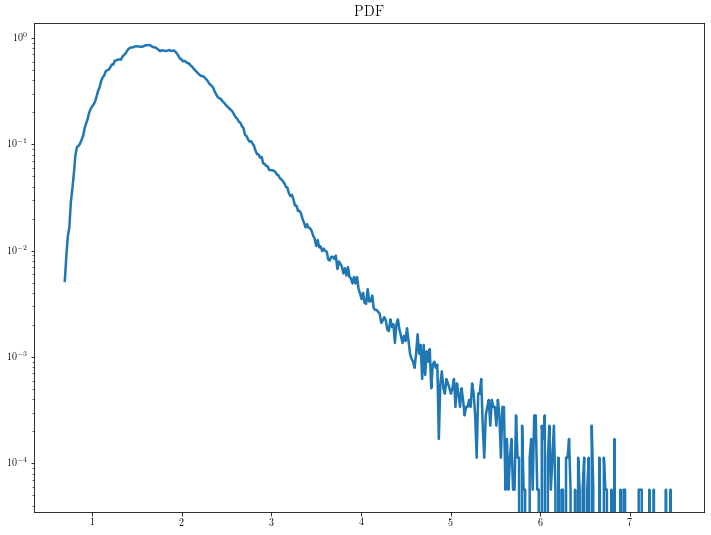

In [108]:
pdf_mfrac = PDF(mfrac+smooth_fbm, bins=None)  
pdf_mfrac.run(verbose=False, do_fit=False)

figure(figsize=(12,9))

pdfbins = pdf_mfrac.bins
pdf = pdf_mfrac.pdf
plot(pdfbins[pdfbins < 7.5], pdf[pdfbins < 7.5])
yscale('log')
title('PDF',fontsize='x-large')